In [1]:
# Helpful tutorials:
# https://www.kaggle.com/code/mohamedkhaledelsafty/opencv-image-processing-techniques
# https://www.kaggle.com/code/bulentsiyah/learn-opencv-by-examples-with-python/notebook
# https://docs.opencv.org/4.x/db/deb/tutorial_display_image.html

# https://pythonprogramming.net/loading-images-python-opencv-tutorial/
# https://docs.opencv.org/4.x/db/deb/tutorial_display_image.html
# https://note.nkmk.me/en/python-opencv-imread-imwrite/

# Blurring: https://www.analyticsvidhya.com/blog/2021/08/advanced-opencv-blurring-an-image-using-the-renowned-opencv-library/
# Sharpening: https://www.analyticsvidhya.com/blog/2021/08/sharpening-an-image-using-opencv-library-in-python/

# Some functions used in this notebook: https://www.kaggle.com/code/bulentsiyah/learn-opencv-by-examples-with-python/notebook

# Python Image Processing 2

# **NOTE:** *"Python Image Processing"* **MUST** be completed prior to this tutorial!

**Developer:** Mark Trombly

**Course:** Exploration into AI, Machine and Deep Learning

**Semester:** Summer 2025

**Program Requirements:**

1. Get data
2. Prepare data
3. Display date
4. **In each of the following examples, research functions/properties/options indicated below.**
5. **NOTE:** *"Python Image Processing"* **MUST** be completed prior to the instructions below!

In [2]:
import pandas as pd # data processing, CSV file I/O (e.g., pd.read_csv)
import numpy as np # all things "numbers and Python" (used here for its array functionality)
import matplotlib.pyplot as plt # display plots, or frames from video or images
import cv2 # image and video processing library (note: cv2 is module import name for opencv-python)

# Listing files

**Note: BE SURE** to place images in "img" subdirecory, and videos in "vids" subdirectory. **BOTH** subdirectories go into the **same** directory as this .ipynb file!

In [3]:
import os
print("Available images:")
for dirname, _, filenames in os.walk('img'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

Available images:
img\aero1.jpg
img\aero3.jpg
img\aloeGT.png
img\aloeL.jpg
img\aloeR.jpg
img\apple.jpg
img\baboon.jpg
img\Background-Subtraction-Tutorial_merged.gif
img\Background_Subtraction_Tutorial_frame.png
img\Background_Subtraction_Tutorial_frame_1.png
img\basketball1.png
img\basketball2.png
img\Blender_Suzanne1.jpg
img\Blender_Suzanne2.jpg
img\blobs.jpg
img\blox.jpg
img\board.jpg
img\box.png
img\box_in_scene.png
img\building.jpg
img\butterfly.jpg
img\cards.png
img\chessboard.png
img\detect_blob.png
img\digits.png
img\ela_modified.jpg
img\ela_original.jpg
img\ellipses.jpg
img\fruits.jpg
img\gradient.png
img\graf1.png
img\hand.jpg
img\HappyFish.jpg
img\home.jpg
img\house.jpg
img\imageTextN.png
img\imageTextR.png
img\left.jpg
img\left01.jpg
img\left02.jpg
img\left03.jpg
img\left04.jpg
img\lena.jpg
img\lena_tmpl.jpg
img\licenseplate_motion.jpg
img\LinuxLogo.jpg
img\mask.png
img\messi5.jpg
img\minions.jpg
img\ml.png
img\notes.png
img\opencv-logo-white.png
img\opencv-logo.png
img\oran

## List all video files

In [4]:
print("Available videos:")
for dirname, _, filenames in os.walk('vids'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

Available videos:
vids\Background-Subtraction-Tutorial_merged.mp4
vids\Background_Subtraction_Tutorial_frame.mp4


# About OpenCV

- Launched in 1999. OpenCV (Open Source Computer Vision), originally from an Intel initiative.
  
- Built to provide a common infrastructure for computer vision applications, and to assist with computer-analyzed perception.

  
- OpenCV's core is written in C++. Python uses a wrapper, which executes C++ code inside of python.

  
- OpenCV' library contains hundreds of optimized algorithms.

  
- OpenCV is useful for computer vision applications, and supported on Windows, Linux, MacOS, Android, iOS with bindings to Python, Java and Matlab.

  
- **Note: OpenCV represents an image in the form of a NumPy array!**

  
- https://opencv.org/about/

![OpenCV logo](img/opencv-logo.png )

## Sharpening Images

- Sharpening enhances the defininition of edges in an image
- Sharpening ***cannot*** correct a *severly* blurred image

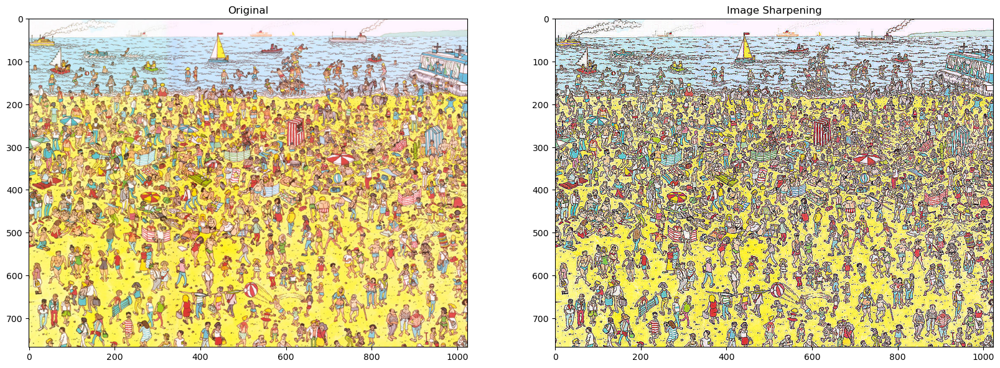

In [5]:
# See "Python Image Processing" tutorial that reference the functions below.
image = cv2.imread('img/waldoBeach.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Note: subplot() function takes three arguments describing layout of figure
# https://www.w3schools.com/python/matplotlib_subplot.asp
plt.figure(figsize=(20,20))
plt.subplot(1, 2, 1) # Translation: figure has 1 row, 2 columns, and this is the 1st plot!
plt.title("Original")
plt.imshow(image)


# Note: In image processing, a "kernel" (aka convolution matrix or mask) is a small matrix used for
# blurring, sharpening, embossing, edge detection, and other types of image manipulation.
# Some commonly used kernels: https://www.analyticsvidhya.com/blog/2021/08/sharpening-an-image-using-opencv-library-in-python/

# Define shapening kernel (3x3 matrix) with values that emphasize edges.
# filter2d function applies this to image to perform sharpening operation.
kernel_sharpening = np.array([[-1,-1,-1],
                              [-1,9,-1],
                              [-1,-1,-1]])

# convalve image with kernel to apply a filter on image
# Note: -1 gives output image depth same as input image
# https://www.askpython.com/python-modules/opencv-filter2d
# https://www.geeksforgeeks.org/python-opencv-filter2d-function/
sharpened = cv2.filter2D(image, -1, kernel_sharpening)


plt.subplot(1, 2, 2) # Translation: figure has 1 row, 2 columns, and this is the 2nd plot!
plt.title("Image Sharpening")
plt.imshow(sharpened)

plt.show()

## Thresholding Images

- Simplest method of segmenting images. That is, divide an image into groups of pixels based upon specific criteria.
- Alter image pixels to make image easier to analyze.
- From a given image, thresholding can be used to create binary images.
- Example: Replace each pixel in image with black or white pixel, based upon image intensity thresholds.
- Replace each pixel in image with a black pixel, if image intensity is less than a fixed value (i.e. 'threshold')
- Replace each pixel in image with a white pixel, if image intensity is greater than a fixed value

**Note:** Below examples use binarization and various other types of thresholding

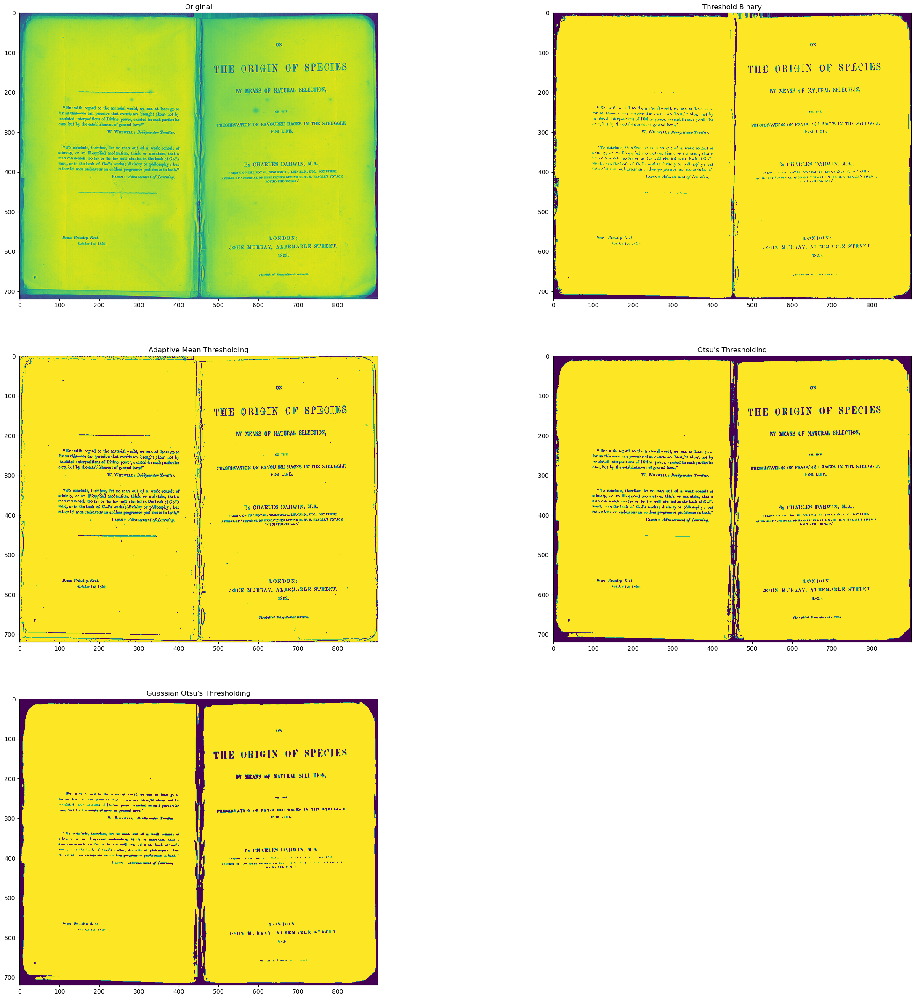

In [6]:
# ***Important Notes***:
# 1. These images are *PURELY* for imaging manipulation purposes *ONLY*.
# 2. ***NO ONE*** can explain our "existence." So, realize *ALL* belief is based upon "faith."
# 3. That is, either we were "Divinely Created," or we "evolved" from a "primordial soup."
# 4. BOTH theories require "faith." Being "Divinely Created" removes the necessity of pondering "Where did the 'primordial soup' come from?"

# Load image
image = cv2.imread('img/Origin_of_Species.jpg', 0)

plt.figure(figsize=(30, 30))
plt.subplot(3, 2, 1)
plt.title("Original")
plt.imshow(image)

# Values below 127 become 0 (i.e., black), everything above 127 becomes 255 (i.e., white)
# https://docs.opencv.org/4.x/d7/d4d/tutorial_py_thresholding.html
ret, thresh1 = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

plt.subplot(3, 2, 2)
plt.title("Threshold Binary")
plt.imshow(thresh1)

# Note: Blurring images removes noise (and smooth images)
# https://www.tutorialkart.com/opencv/python/opencv-python-gaussian-image-smoothing/
image = cv2.GaussianBlur(image, (3, 3), 0)

# adaptive thresholding
# https://docs.opencv.org/4.x/d7/d4d/tutorial_py_thresholding.html
thresh = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 3, 5)

plt.subplot(3, 2, 3)
plt.title("Adaptive Mean Thresholding")
plt.imshow(thresh)

# Otsu' thresholding
# https://docs.opencv.org/4.x/d7/d4d/tutorial_py_thresholding.html
_, th2 = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

plt.subplot(3, 2, 4)
plt.title("Otsu's Thresholding")
plt.imshow(th2)

plt.subplot(3, 2, 5)
# Otsu's thresholding after Gaussianfiltering
blur = cv2.GaussianBlur(image, (5,5), 0)
_, th3 = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
plt.title("Guassian Otsu's Thresholding")
plt.imshow(th3)
plt.show()

"Adaptive Mean Thresholding" and "Otsu's Thresholding" appear to be rater close in clarity, with "Adaptive Mean Thresholding" possibly being the better of the two.

## Edge Detection

- Used to identify boundaries (edges) of objects, or regions within an image.
- Edges are very important features associated with images.
- The underlying structure of an image can be determined through its edges.

[https://towardsdatascience.com/easy-method-of-edge-detection-in-opencv-python-db26972deb2d](https://towardsdatascience.com/easy-method-of-edge-detection-in-opencv-python-db26972deb2d)

[https://medium.com/data-science/easy-method-of-edge-detection-in-opencv-python-db26972deb2d](https://medium.com/data-science/easy-method-of-edge-detection-in-opencv-python-db26972deb2d)

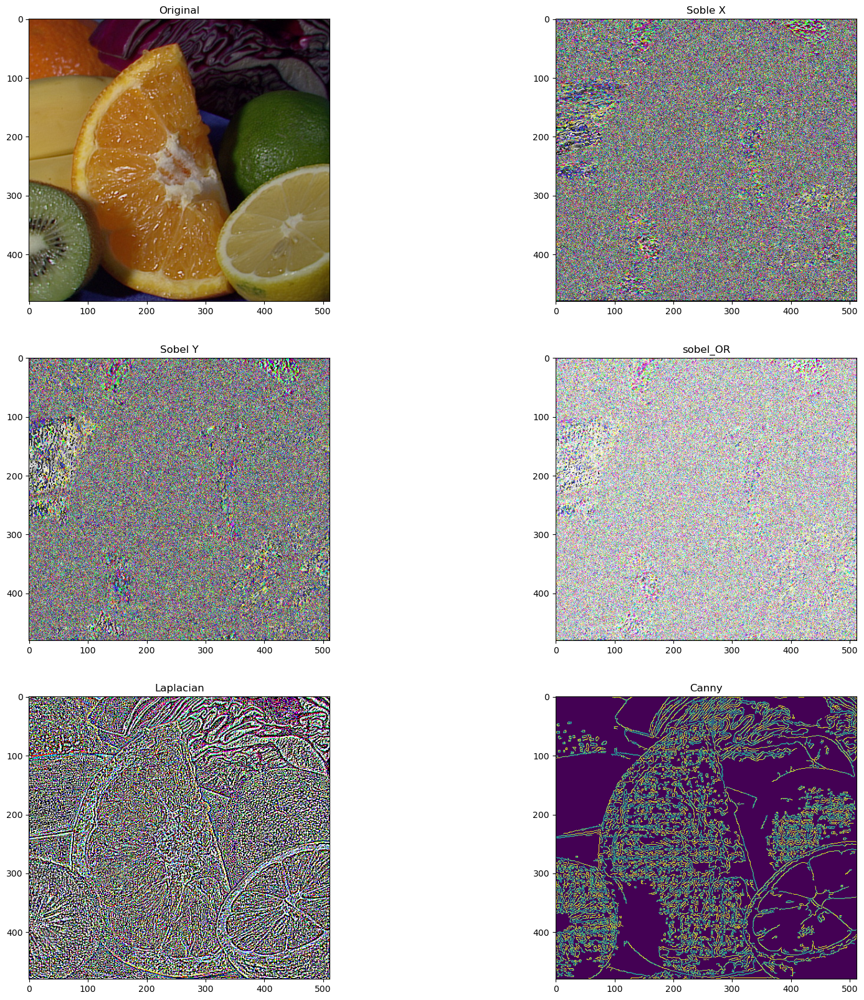

In [7]:
image = cv2.imread('img/fruits.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Solution to error: "Clipping input data to the valid range for imshow..."
# Cast to unsigned data type. Example, uint8 or uint16.
image = image.astype('uint8')

height, width,_ = image.shape

# Extract Sobel Edges
# reference: https://en.wikipedia.org/wiki/Sobel_operator
sobel_x = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=5)
sobel_y = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=5)

# same solution to clipping error as above
sobel_x = sobel_x.astype('uint8')
sobel_y = sobel_y.astype('uint8')

plt.figure(figsize=(20,20))

plt.subplot(3, 2, 1)
plt.title("Original")
plt.imshow(image)

plt.subplot(3, 2, 2)
plt.title("Soble X")
plt.imshow(sobel_x)

plt.subplot(3, 2, 3)
plt.title("Sobel Y")
plt.imshow(sobel_y)

# Note: bitwise AND, OR, NOT, and XOR operations are very useful when extracting parts of an image.
# References:
# https://docs.opencv.org/3.4/d0/d86/tutorial_py_image_arithmetics.html
# https://pyimagesearch.com/2021/01/19/opencv-bitwise-and-or-xor-and-not/
sobel_OR = cv2.bitwise_or(sobel_x, sobel_y)

plt.subplot(3, 2, 4)
plt.title("sobel_OR")
plt.imshow(sobel_OR)

# Note: Laplacian() function detects sudden intensity transitions in an image, and highlights edges.
# References:
# https://docs.opencv.org/3.4/d5/db5/tutorial_laplace_operator.html
# https://www.bogotobogo.com/python/OpenCV_Python/python_opencv3_Image_Gradient_Sobel_Laplacian_Derivatives_Edge_Detection.php
# https://www.sciencedirect.com/topics/engineering/Laplacian-filter
laplacian = cv2.Laplacian(image, cv2.CV_64F)

# Same solution as abve to error. "Clipping input data to the valid range for imshow..."
laplacian = laplacian.astype('uint8')

plt.subplot(3, 2, 5)
plt.title("Laplacian")
plt.imshow(laplacian)

# Conny Edge Detection: Multi-stage algorithm for edge detections uses gradient values as thresholds
# First argument is input image. Second and third arguments are minVal and maxVal threshold values, respectively.
# Note: minVal and maxVal thresholds will differ depending upon each image (through trial and error).
# Any gradient value larger than maxVal considered to be on edge.
# Any value below minVal considered *not* to be an edge, and discarded.
# Here, any gradient values below 50 considered non-edges, and discarded. Values above 120 are considered edges.
# Values in between minVal and maxVal thresholds are classified edges or non-edges based on their connectivity.

# Canny Edge Detection: https://docs.opencv.org/4.x/da/d22/tutorial_py_canny.html
canny = cv2.Canny(image, 50, 120)

plt.subplot(3, 2, 6)
plt.title("Canny")
plt.imshow(canny)

## Edge Detection - Choosing Thresholds

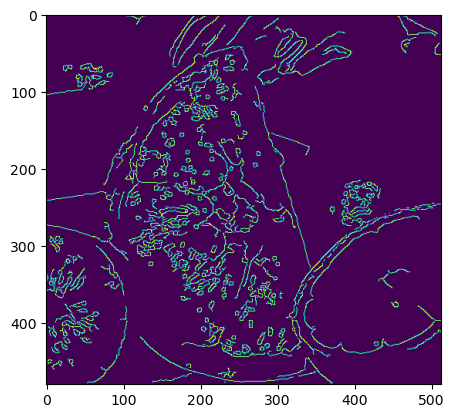

In [8]:
img = cv2.imread('img/fruits.jpg')
img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Calculate median pixel value
med_val = np.median(img)

# Lower bound is either 0 or 70% of median value, whichever is higher
lower = int(max(0, 0.7 * med_val))

# Upper bound is either 255 or 30% above median value, whichever is lower
upper = int(min(255,1.3 * med_val))

# blur() function: Blurs an image using the normalized box filter.
# https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#ga8c45db9afe636703801b0b2e440fce37
blurred_img = cv2.blur(img, ksize=(5,5))

# Then, use Canny() to find edges
# Again, thresholds will differ depending upon each image (through trial and error)
edges = cv2.Canny(image=blurred_img, threshold1=lower, threshold2=upper+40)
plt.imshow(edges)

## Image Perspective Transform

- getPerpectiveTransform(): Aligns images as needed.
- Transforms images according to the required change in viewpoint.

[https://theailearner.com/tag/cv2-getperspectivetransform](https://theailearner.com/tag/cv2-getperspectivetransform)

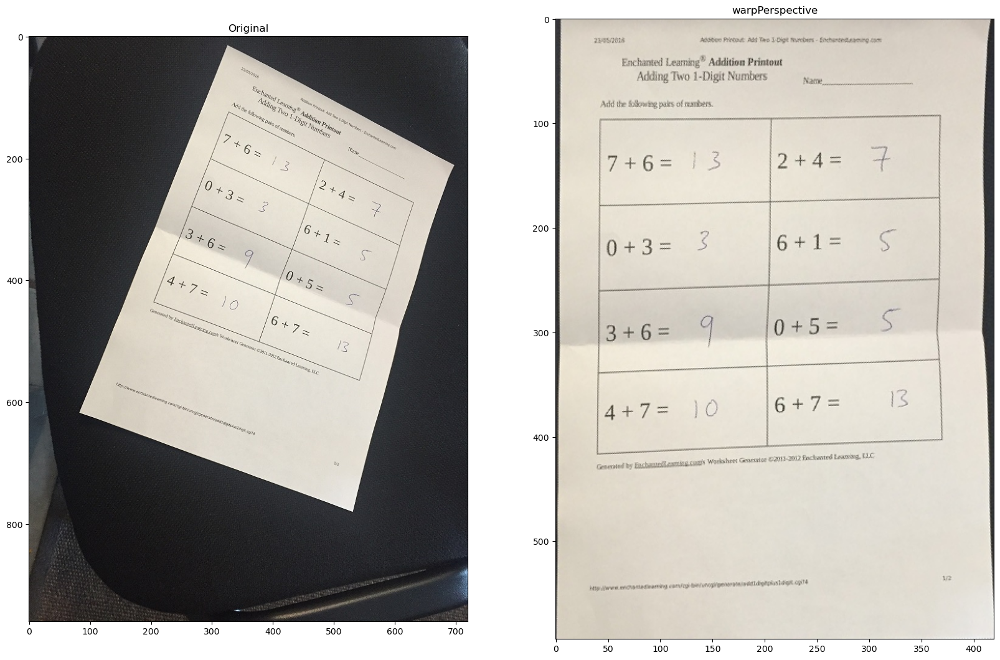

In [9]:
image = cv2.imread('img/scan.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,20))

plt.subplot(1, 2, 1)
plt.title("Original")
plt.imshow(image)

# Fild coordinates for 4 corners of original image
points_A = np.float32([[320,15], [700,215], [85,610], [530,780]])

# Calculate coordinates of 4 corners of desired output
# Ratio for A4 paper size 1 : 1.41 (international standard paper size)
points_B = np.float32([[0,0], [420,0], [0,594], [420,594]])

# getPerspectiveTransform(): Changes an image viewpoint (Calculates a perspective transform from four pairs of correcsponding points.)
# Here, using two sets of four points to compute Perspective Transformation matrix, M
M = cv2.getPerspectiveTransform(points_A, points_B)

# Once transformation matrix (M) is calculated, pass it to warpPerspective() function that applies to perspective transformation to an image.
# warpPerspective(): Applies a perspective transformation to an image.
# https://docs.opencv.org/4.x/da/d54/group__imgproc__transform.html#gof7367a7e8e18ec6963e3774e6a94b87
# https://theailearner.com/tag/cv2-warpperspective/
warped = cv2.warpPerspective(image, M, (420,594))

plt.subplot(1, 2, 2)
plt.title("warpPerspective")
plt.imshow(warped)

## Blurring Images

- Make images less clear or distinct.
- Why? Smooths edges and removes noise from an image.

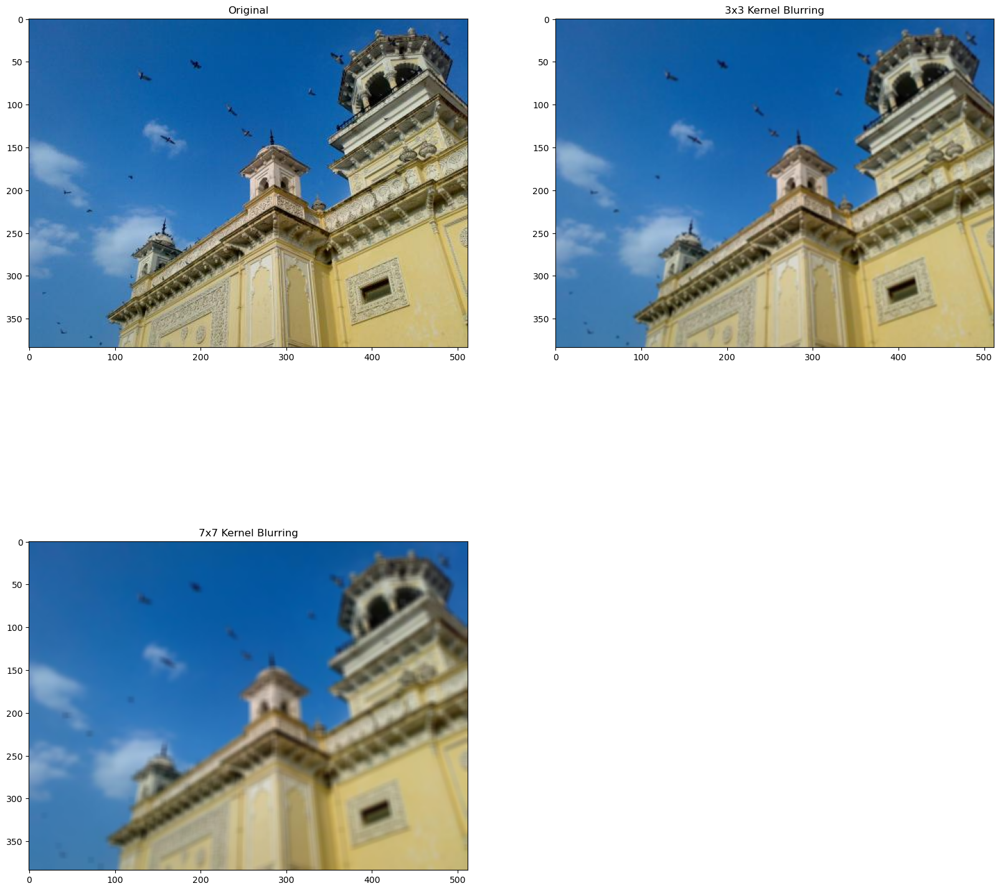

In [10]:
image = cv2.imread('img/home.jpg')
image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

# Create 2x3 kernel
kernel_3x3 = np.ones((3, 3), np.float32) / 9

# Use cv2.filter2D() function to convalue kernal with image
# See above:
# convalue image with kernel to apply a filter on image
# Note: -1 gives output image depth same as input image
# https://www.askpython.com/python-modules/opencv-filter2d
# https://www.geeksforgeeks.org/python-opencv-filter2d-function/
blurred = cv2.filter2D(image, -1, kernel_3x3)

plt.subplot(2, 2, 2)
plt.title("3x3 Kernel Blurring")
plt.imshow(blurred)

# Experiment/Play!: Creat 7x7 kernel
kernel_7x7 = np.ones((7, 7), np.float32) / 49

blurred2 = cv2.filter2D(image, -1, kernel_7x7)

plt.subplot(2, 2, 3)
plt.title("7x7 Kernel Blurring")
plt.imshow(blurred2)

## Image Contours

- Contours can be explained simply as a curve joining all the continuous points (along the boundary), having same color or intensity.
- Useful tool for shape analysis and object detection and recognition
- For better accuracy, use binary images. That is, before finding contours, apply threshold or canny edge detection.
- Example: Like finding white object from black background.

[https://docs.opencv.org/3.4/d4/d73/tutorial_py_contours_begin.html](https://docs.opencv.org/3.4/d4/d73/tutorial_py_contours_begin.html)

Number of Contours found = 1


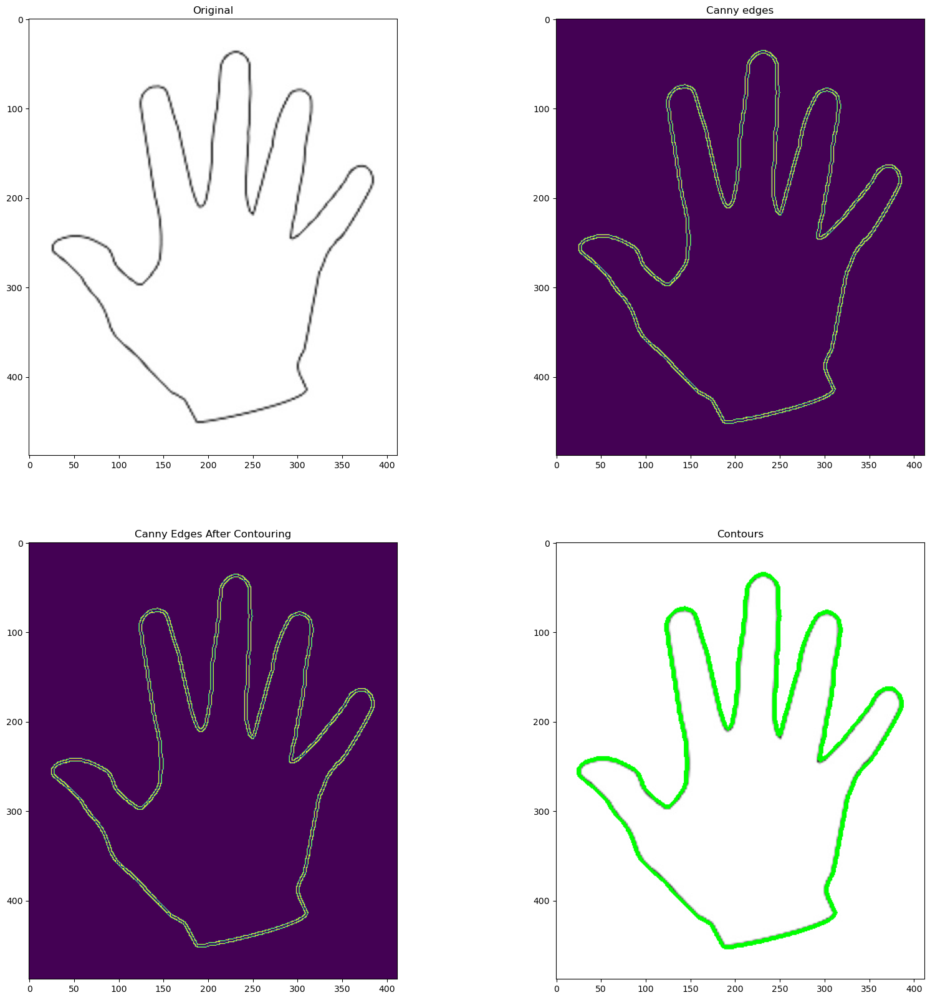

In [11]:
# Load image with 3 black squares
image = cv2.imread('img/hand.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

# Grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Find edges
edged = cv2.Canny(gray, 30, 200)

plt.subplot(2, 2, 2)
plt.title("Canny edges")
plt.imshow(edged)

# Find Contours
# findCountours(): Finds contours in binary image.
# https://docs.opencv.org/3.4/d3/dc0/group__imgproc__shape.html#ga17ed9f5d79ae97bd4c7cf18403e1689a
# *BE PREPARED* to answer what the following options do: RETR_EXERNAL and CHAIN_APPROX_NONE.
contours, hierachy = cv2.findContours(edged, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

plt.subplot(2, 2, 3)
plt.title("Canny Edges After Contouring")
plt.imshow(edged)

print("Number of Contours found = " + str(len(contours)))

# Draw all contours (use -1 as 3rd parameter to draw all)
# drawContours(): Draws contours outlines or filled contours.
# https://docs.opencv.org/3.4/d6/d6e/group__imgproc__draw.html#ga746c0625f1781f1ffc9056259103edbc
cv2.drawContours(image, contours, -1, (0,255,0), 3)

plt.subplot(2, 2, 4)
plt.title("Contours")
plt.imshow(image)

## Aproximating Contours and Convex Hull

convexHull():

- Similar to contour approximation--though, not the same.
- Creates convex curve around an object.
- Set of pixels included in smallest convex polygon that surround all white pixels in input image.
- Finds convex hull of a point set.

[https://tutorialspoint.com/how-to-find-and-draw-convex-hull-of-an-image-contour-in-opencv-python](https://tutorialspoint.com/how-to-find-and-draw-convex-hull-of-an-image-contour-in-opencv-python)

[https://docs.opencv.org/3.4/d3/dc0/group__imgproc__shape.html#ga014b28e56cb8854c0de4a211cb2be656](https://docs.opencv.org/3.4/d3/dc0/group__imgproc__shape.html#ga014b28e56cb8854c0de4a211cb2be656)

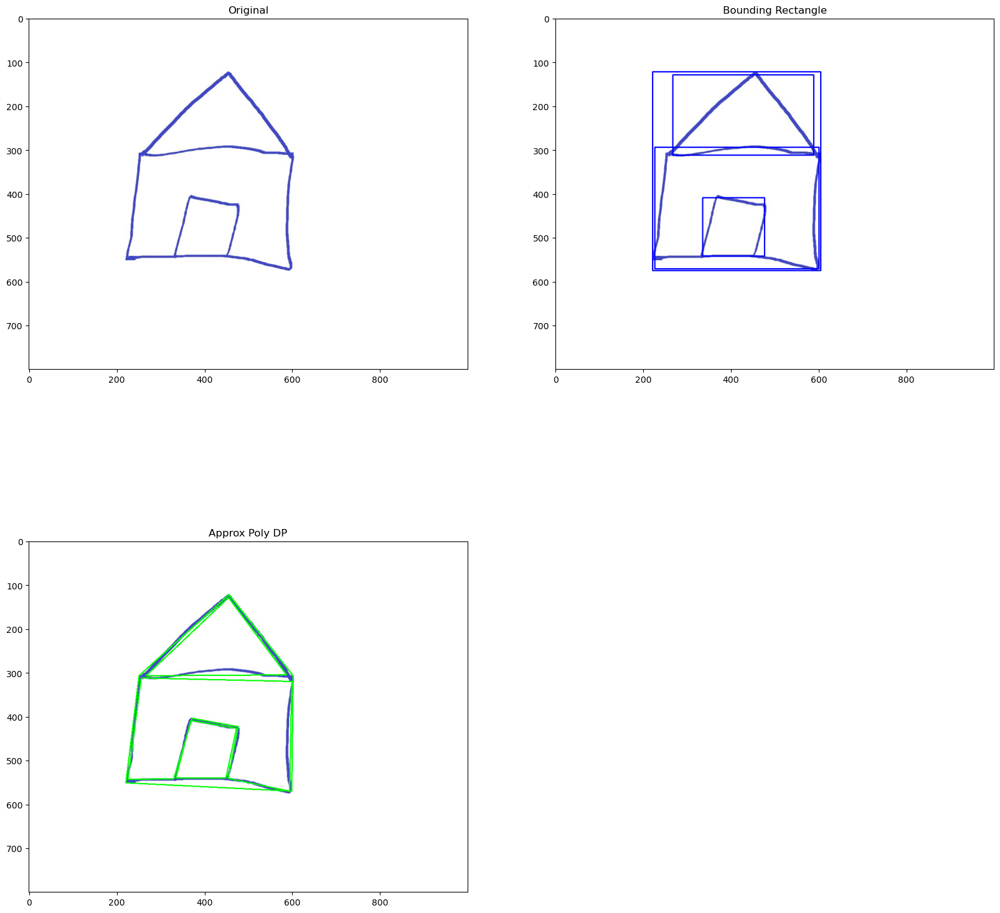

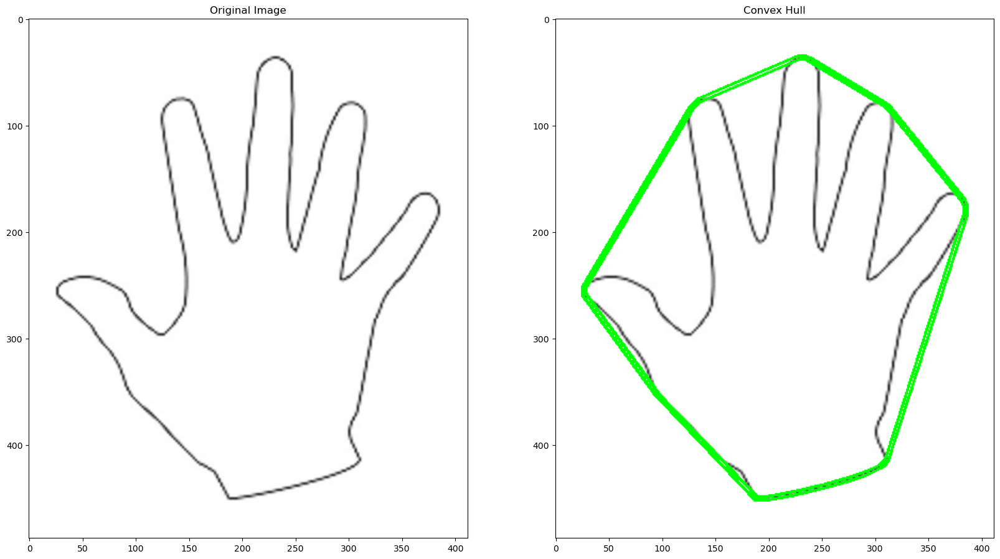

In [12]:
# Load image and copy
image = cv2.imread('img/house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

orig_image = image.copy()

# Grayscale and binarize
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# *Be Prepared* to answer what does THRESH_BINARY_INV do?
ret, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV)

# Find contours
contours, hierarchy= cv2.findContours(thresh.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

# Iterate through each contour and compute bounding rectangle
for c in contours:
    x,y,w,h = cv2.boundingRect(c)
    cv2.rectangle(orig_image,(x,y),(x+w,y+h),(0,0,255),2)
    plt.subplot(2, 2, 2)
    plt.title("Bounding Rectangle")
    plt.imshow(orig_image)

# Iterate through each contour and compute approx contour
for c in contours:
    # Calculate accuracy as a percent of contour perimeter
    accuracy = 0.03 * cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, accuracy, True)
    cv2.drawContours(image, [approx], 0, (0, 255, 0), 2)

    plt.subplot(2, 2, 3)
    plt.title("Approx Poly DP")
    plt.imshow(image)

plt.show()

# Convex Hull

image = cv2.imread('img/hand.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(20, 20))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image)

# Threshold image
ret, thresh = cv2.threshold(gray, 176, 255, 0)

# Find contours
# *Be Prepared* to answer following question: What does RETR_LIST do?
contours, hierarchy = cv2.findContours(thresh.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)

# Sort Contours by area then, remove largest frame contour
n = len(contours) - 1
contours = sorted(contours, key=cv2.contourArea, reverse=False)[:n]

# Iterate through contours and draw convex hull
for c in contours:
    hull = cv2.convexHull(c)
    cv2.drawContours(image, [hull], 0, (0, 255, 0), 2)

    plt.subplot(1, 2, 2)
    plt.title("Convex Hull")
    plt.imshow(image)

## Image Corners

- Corners are regions w/in the image with large variations in intensity in all directions.
- Extracts corners *and* features from the input image.

[https://docs.opencv.org/3.4/dc/d0d/tutorial_py_features_harris.html](https://docs.opencv.org/3.4/dc/d0d/tutorial_py_features_harris.html)

[https://theailearner.com/tag/cv2-cornerharris](https://theailearner.com/tag/cv2-cornerharris)

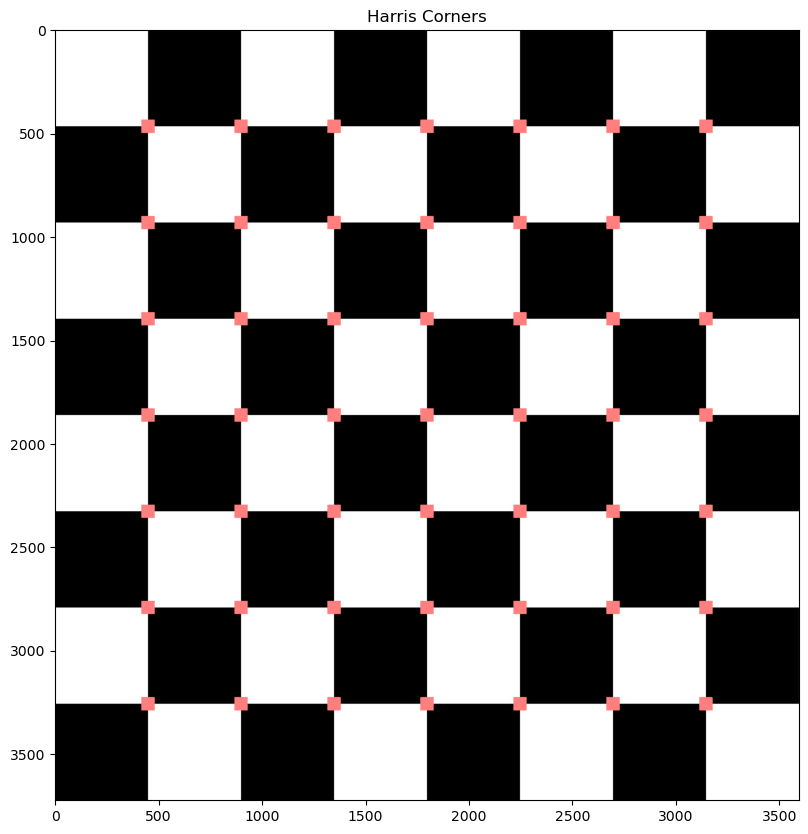

In [13]:
# Load image then grayscale
image = cv2.imread('img/chessboard.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# cornerHarris() function: requires grayscale and array datatype to be float32.
gray = np.float32(gray)

harris_corners = cv2.cornerHarris(gray, 3, 3, 0.05)

# dilate() function: enlarges/enhances corner points
# https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#ga4ff0f3318642c4f469d0e11f242f3b6c
kernel = np.ones((7,7),np.uint8)
harris_corners = cv2.dilate(harris_corners, kernel, iterations = 10)

# Threshold for optimal values--varies depending upon image.
image[harris_corners > 0.025 * harris_corners.max() ] = [255, 127, 127]

plt.subplot(1, 1, 1)
plt.title("Harris Corners")
plt.imshow(image)

## Image Background Subtraction - Motion Analysis

- Used for detecting moving objects in videos.
- Rationale: Detects moving objects from difference between current frame and a reference frame (aka "background image", or "background model").

source: [https://en.wikipedia.org/wiki/Foreground_detection](https://en.wikipedia.org/wiki/Foreground_detection)

![](https://docs.opencv.org/4.x/Background_Subtraction_Tutorial_Scheme.png)

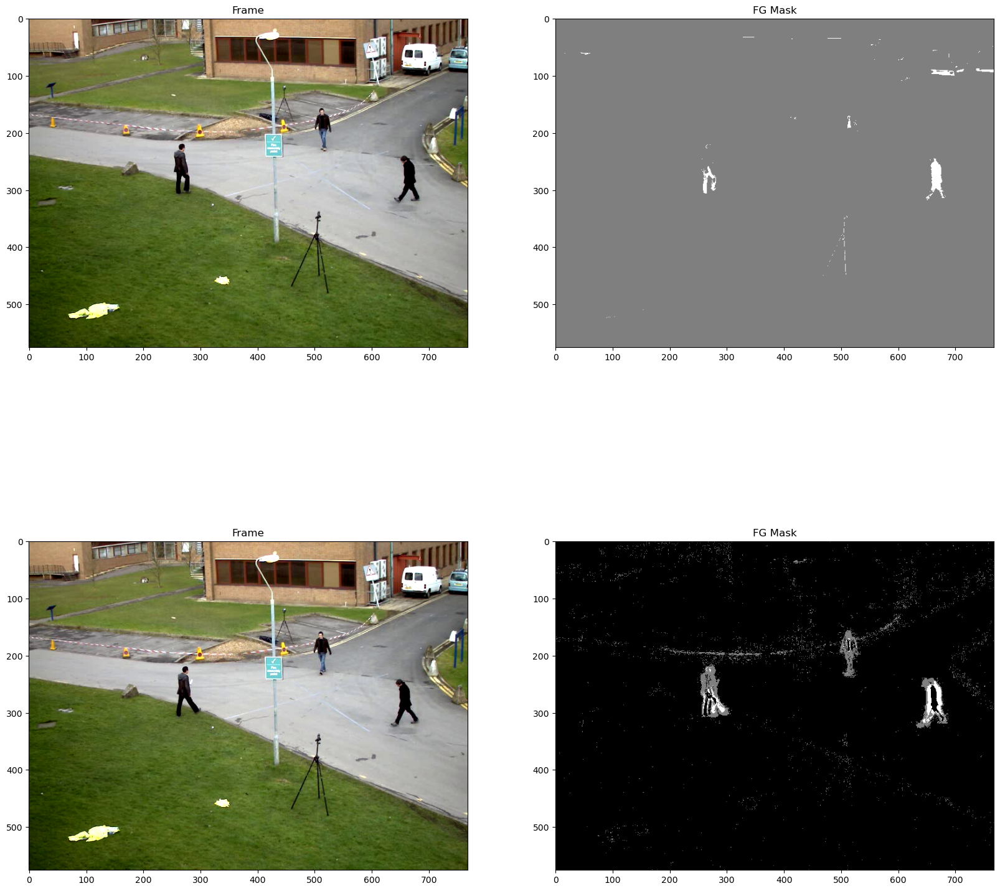

In [14]:
# Background Subraction Methods:
# technique for generating foreground mask
# *Be Prepared* why do we use "masks"?
# https://docs.opencv.org/4.x/d1/dc5/tutorial_background_subtraction.html

# *Be Prepared* to answer whatdoes "MOG" stand for?
# Create variable with value 'MOG2'
algo = 'MOG2'

# Depending upon image analysis, use one of two image background subtraction algorithms.
# https://docs.opencv.org/3.4/d7/d7b/classcv_1_1BackgroundSubtractorMOG2.html
# or...
# https://docs.opencv.org/3.4/db/d88/classcv_1_1BackgroundSubtractorKNN.html
if algo == 'MOG2':
    backSub = cv2.createBackgroundSubtractorMOG2()
else:
    backSub = cv2.createBackgroundSubtractorKNN()

plt.figure(figsize=(20, 20))

frame = cv2.imread('img/Background_Subtraction_Tutorial_frame.png')
fgMask = backSub.apply(frame)

plt.subplot(2, 2, 1)
plt.title("Frame")
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

plt.subplot(2, 2, 2)
plt.title("FG Mask")
plt.imshow(cv2.cvtColor(fgMask, cv2.COLOR_BGR2RGB))

frame = cv2.imread('img/Background_Subtraction_Tutorial_frame_1.png')
fgMask = backSub.apply(frame)

plt.subplot(2, 2, 3)
plt.title("Frame")
plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

plt.subplot(2, 2, 4)
plt.title("FG Mask")
plt.imshow(cv2.cvtColor(fgMask, cv2.COLOR_BGR2RGB))

## Image Scaling and RE-Sizing

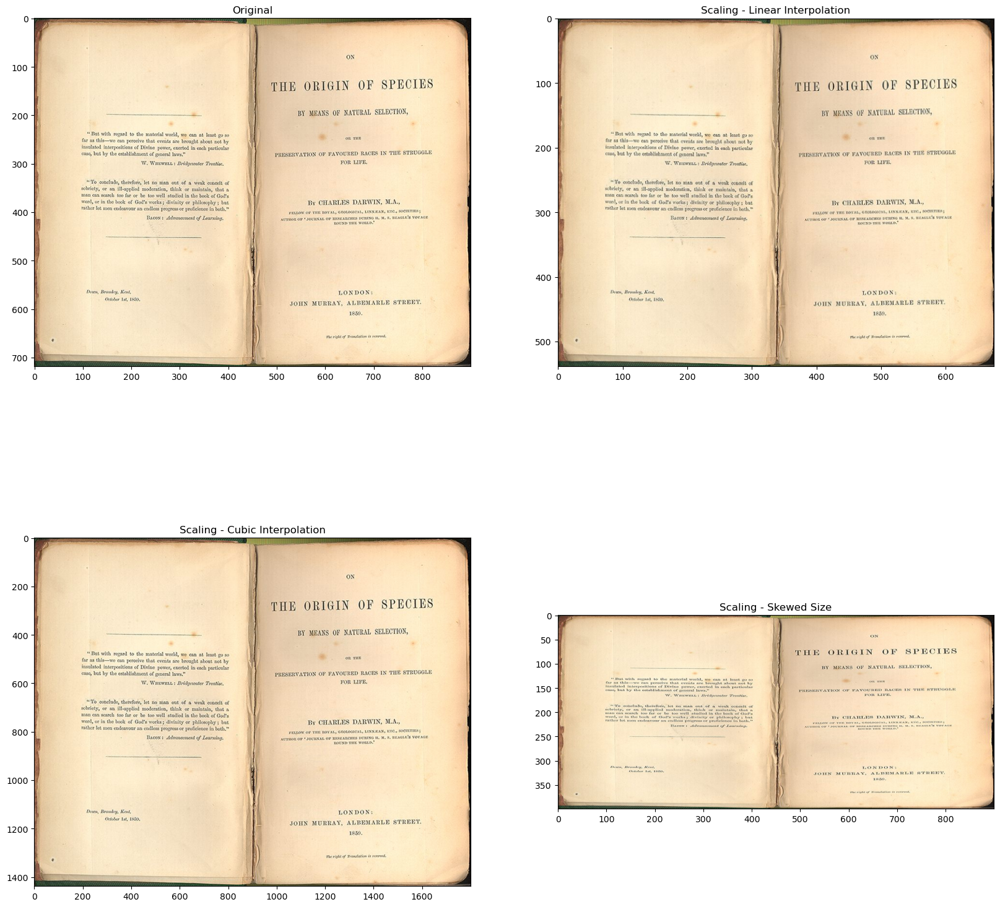

In [15]:
image = cv2.imread('img/Origin_of_Species.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.title("Original")
plt.imshow(image)

# Make image 75% of original size
image_scaled = cv2.resize(image, None, fx=0.75, fy=0.75)

plt.subplot(2, 2, 2)
plt.title("Scaling - Linear Interpolation")
plt.imshow(image_scaled)

# Now, double image size
# *Be Prepared* to answer, What does INTER_CUBIC do?
img_scaled = cv2.resize(image, None, fx=2, fy=2, interpolation= cv2.INTER_CUBIC)

plt.subplot(2, 2, 3)
plt.title("Scaling - Cubic Interpolation")
plt.imshow(img_scaled)

# Skew image size by setting specific width, length dimensions
# *Be Prepared* to answer, What does INTER_AREA do?
img_scaled = cv2.resize(image, (900, 400), interpolation = cv2.INTER_AREA)

plt.subplot(2, 2, 4)
plt.title("Scaling - Skewed Size")
plt.imshow(img_scaled)